In [2]:
# Change Python path
import os, sys
os.chdir("/LOCALDATA/ARTHURs_FILES/Codigos/")
print(os.getcwd()) # -> Should return the root Codigos/ folder
sys.path.append('python_modules')

# Enables modules autoreload (important during development)
%load_ext autoreload
%autoreload 2

/LOCALDATA/ARTHURs_FILES/Codigos


In [3]:
# from dask.distributed import Client

# client = Client()
# client

In [4]:
from options import *

In [5]:
from data_managers.load_save_mhws import load_mhws_dataset

# ds_mhws = load_nc_to_dataset("mhws_cmems_sst_balears_transposed.nc")
ds_mhws = load_mhws_dataset("cmems_sst", "balears", (1987,2021))
# ds_mhws = load_mhws_dataset("cmems_sst", [1982,2015])
ds_mhws

Loaded MHWs dataset.


<xarray.Dataset> Size: 50MB
Dimensions:               (lat: 69, lon: 120, year: 42)
Coordinates:
  * lon                   (lon) float32 480B -0.8591 -0.8091 ... 5.046 5.096
  * lat                   (lat) float32 276B 37.65 37.7 37.75 ... 41.01 41.06
  * year                  (year) int64 336B 1982 1983 1984 ... 2021 2022 2023
Data variables: (12/18)
    count                 (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 8.0 9.0
    total_days            (lat, lon, year) float64 3MB 0.0 0.0 ... 135.0 115.0
    moderate_days         (lat, lon, year) float64 3MB 0.0 0.0 ... 101.0 94.0
    strong_days           (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 34.0 20.0
    severe_days           (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 0.0 0.0
    extreme_days          (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 0.0 0.0
    ...                    ...
    duration              (lat, lon, year) float64 3MB nan nan ... 16.88 12.78
    rate_onset            (lat, lon, year) float64 3MB nan nan ... 0.2125 0.2357
    rate_decline          (lat, lon, year) float64 3MB nan nan ... 0.5874 0.3342
    temp_min              (lat, lon, year) float64 3MB nan nan ... 13.0 13.04
    temp_mean             (lat, lon, year) float64 3MB nan nan ... 19.78 19.58
    temp_max              (lat, lon, year) float64 3MB nan nan ... 29.12 28.81
Attributes:
    climatologyPeriod:  1987-2021
    description:        MHWs yearly statistics computed using the marineHeatW...
    acknowledgment:     Generated using E.U. Copernicus Marine Service Inform...

## Maps one stat evolution

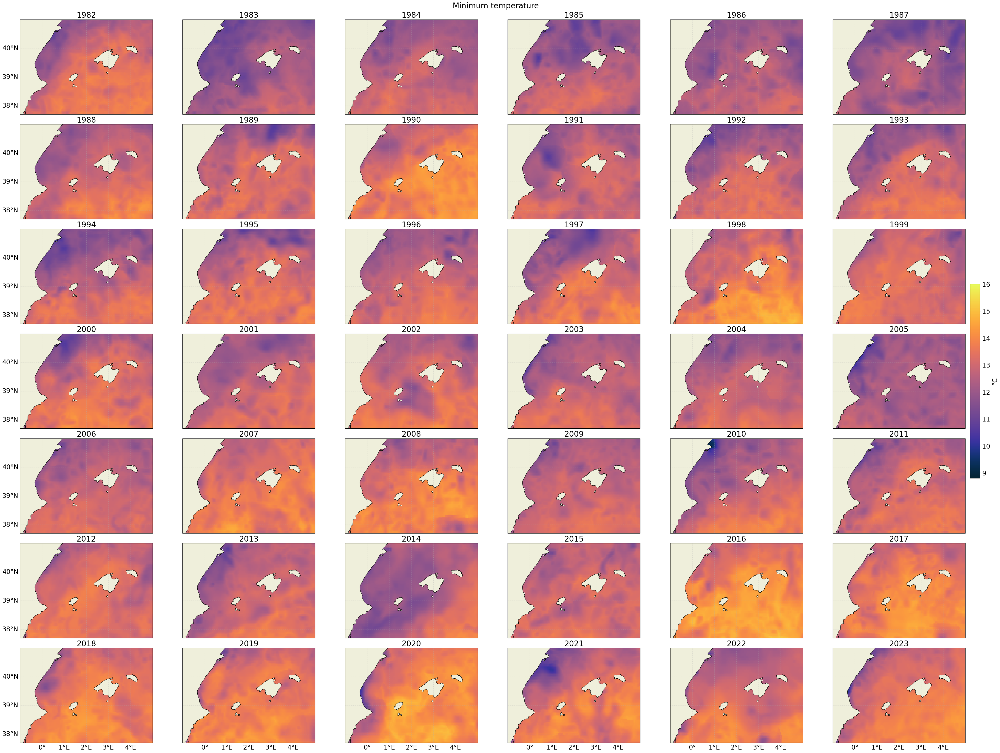

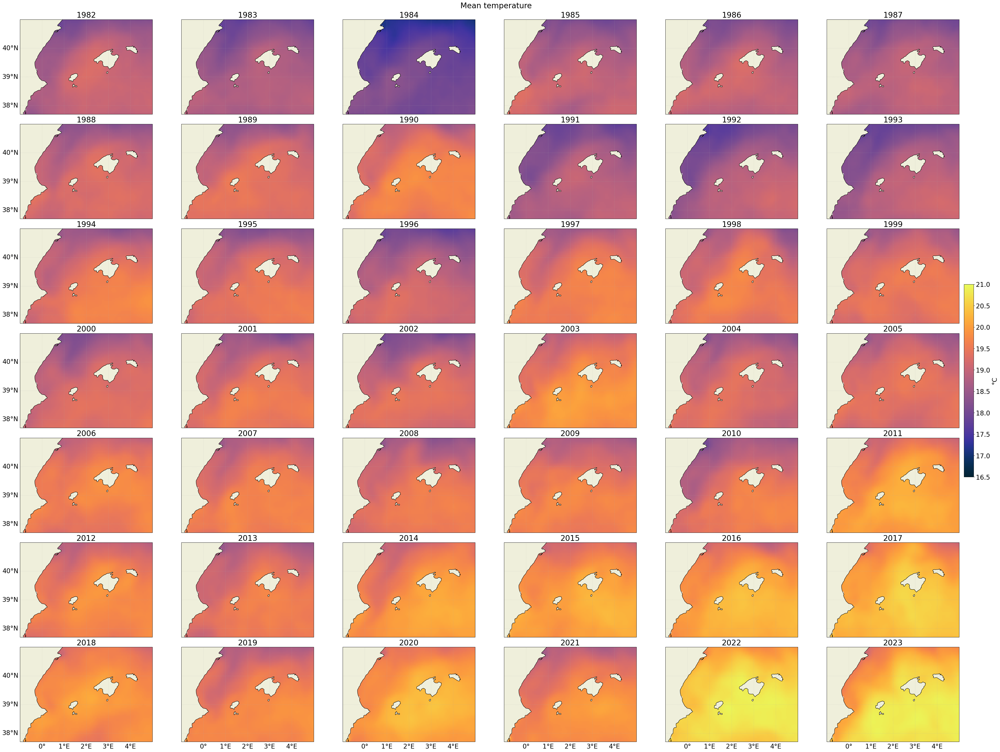

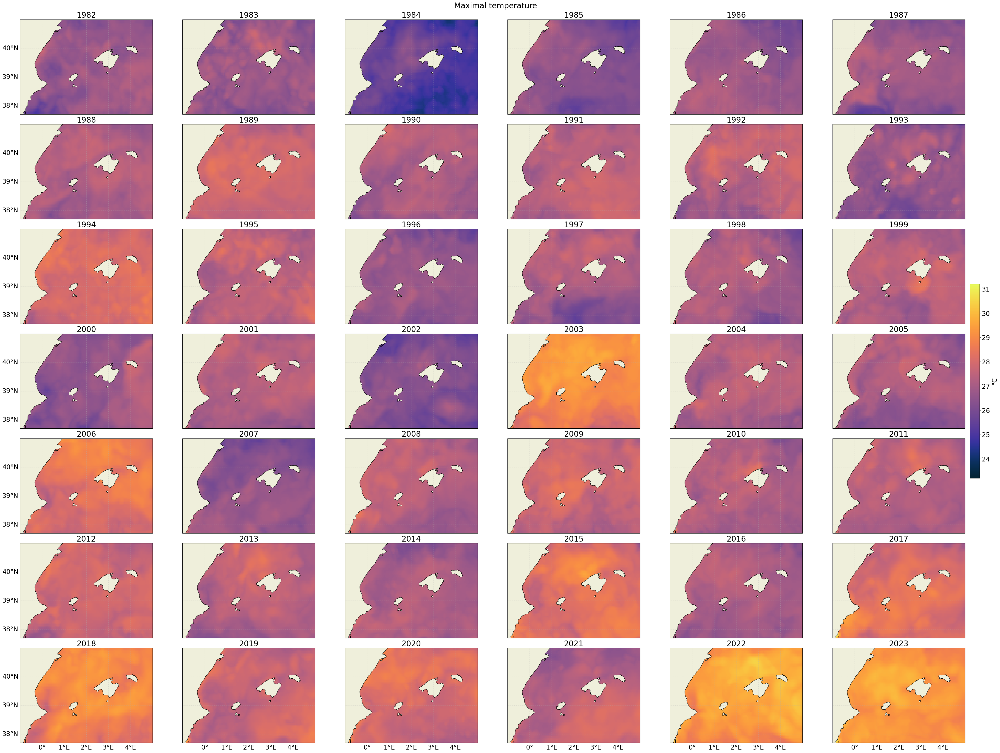

In [6]:
from data_plotters.mhw_plot import plot_1stat_years_mhws_maps

year_step = 1
ncols = 6
offset = 0
# year_step = 1
# ncols = 6

for stat in mhws_temp_stats:
    plot_1stat_years_mhws_maps(
        ds_mhws,
        range(ds_mhws.year.min().values+offset, ds_mhws.year.max().values+1, year_step),
        # range(ds_mhws.year.min().values, ds_mhws.year.max().values, 5),
        stat,
        ncols=ncols,
        custom_vlims={
            # "duration":             (0, 366),
            # "total_days":           (0, 366),
            # "moderate_days":        (0, 366),
            # "strong_days":          (0, 366),
            # "severe_days":          (0, 366),
            # "extreme_days":         (0, 366),
        }
    )

## Maps of stats for 1 year

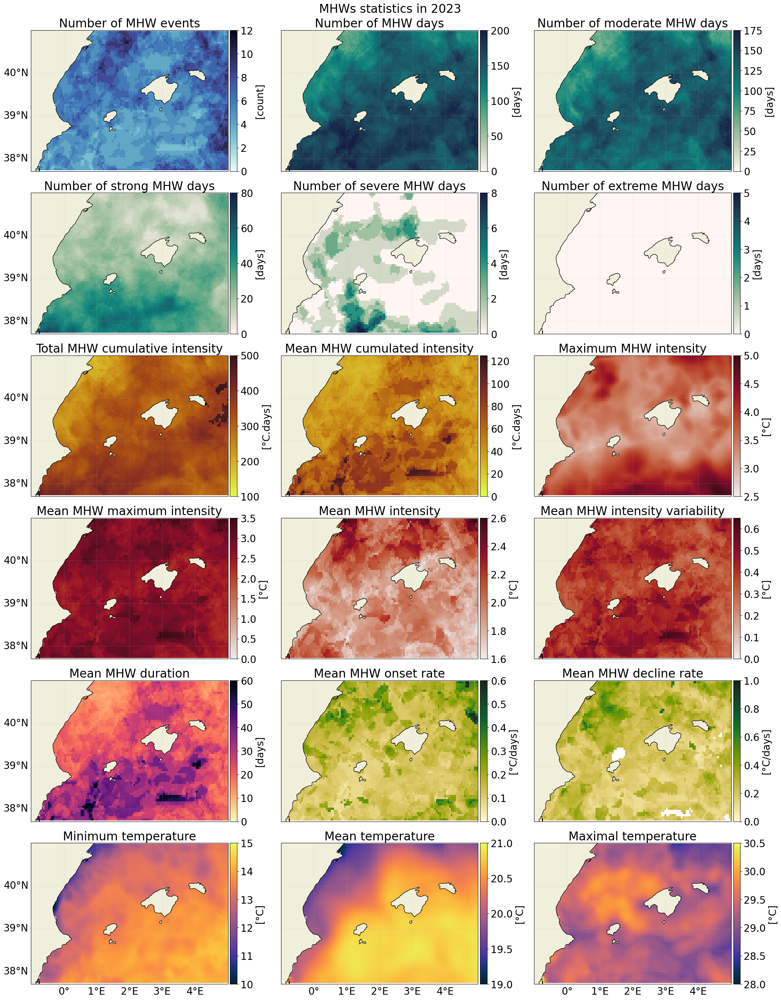

In [ ]:
from data_plotters.mhw_plot import plot_1year_stats_mhws_maps

stat_vlims = {
    "count":                (0, 12), # 0.00-11.00
    "total_days":           (0, 200), # 0.00-206.00
    "duration":             (0, 60), # 9.62-61.00
    "total_icum":           (100, 500), # 0.00-502.79
    "intensity_max_max":    (2.5, 5), # 2.86-4.95
    "intensity_mean":       (1.6, 2.6), # 1.59-2.63
    "intensity_max":        (0, 3.5), # 2.13-3.49
    "intensity_cumulative": (0, 125), # 23.14-126.17
    "intensity_var":        (0, 0.65), # 0.25-0.64
    "rate_onset":           (0, 0.6), # 0.04-0.63
    "rate_decline":         (0, 1), # 0.07-0.96
    "moderate_days":        (0, 175), # 0.00-174.00
    "strong_days":          (0, 80), # 0.00-67.00
    "severe_days":          (0, 8), # 0.00-10.00
    "extreme_days":         (0, 5), # 0.00-0.00
    "temp_min":             (10, 15), # 9.96-14.46
    "temp_mean":            (19, 21), # 19.04-20.92
    "temp_max":             (28, 30.5), # 28.46-30.66
}

plot_1year_stats_mhws_maps(
    ds_mhws,
    year = 2023,
    stat_set = "basic",
    custom_vlims=stat_vlims
)

## Random time series

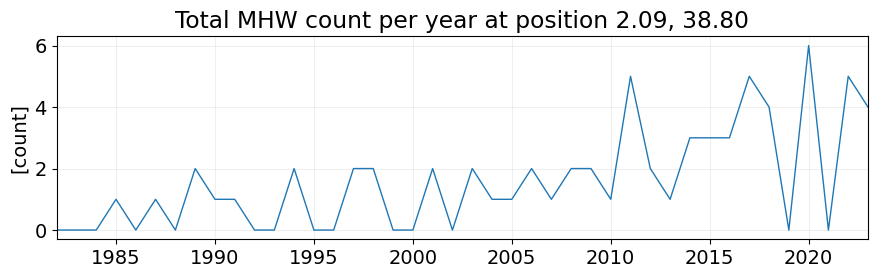

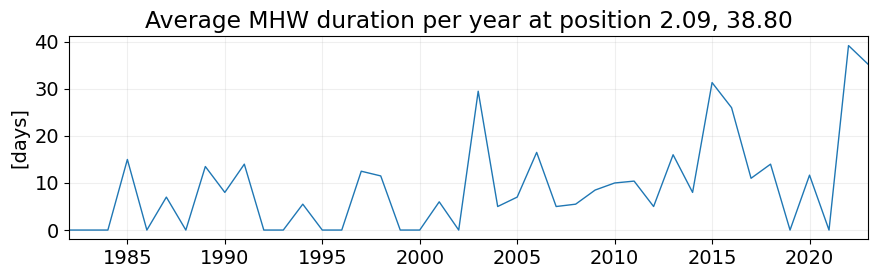

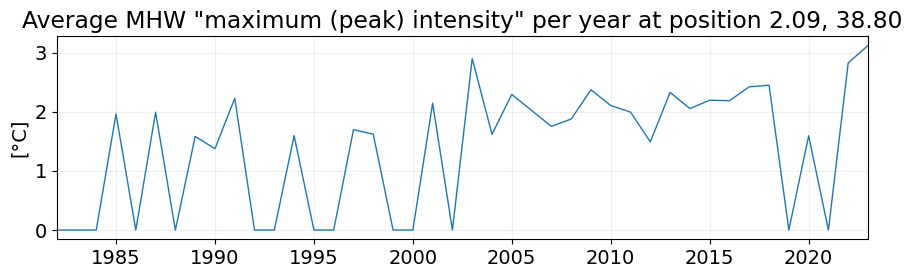

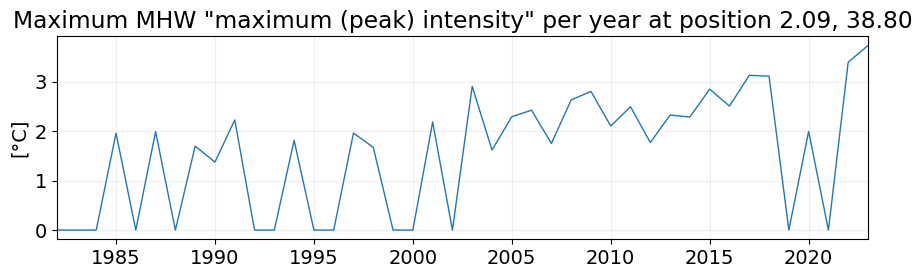

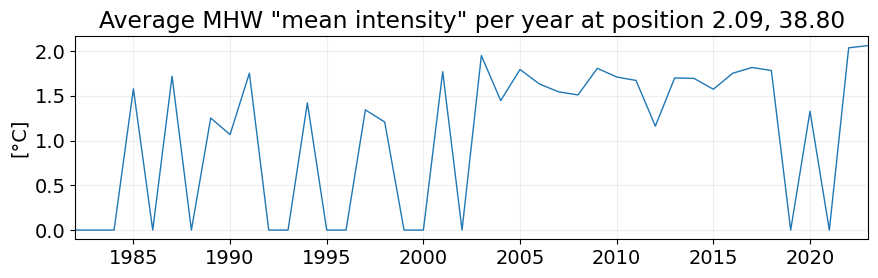

...

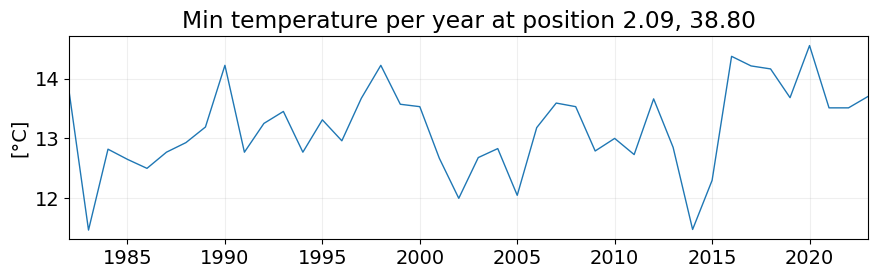

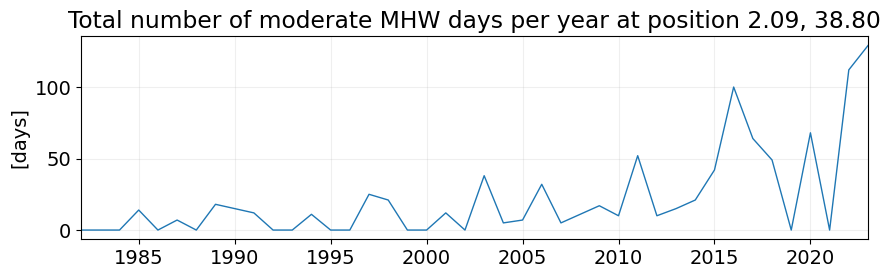

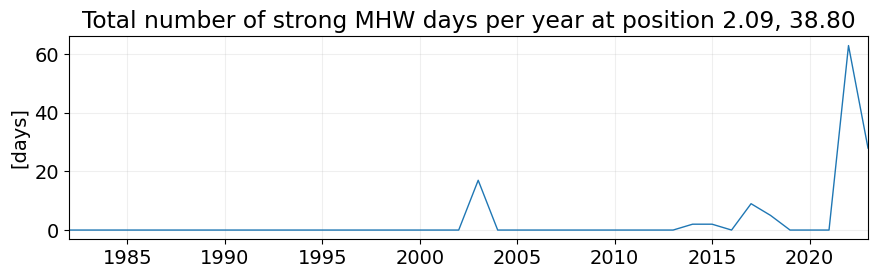

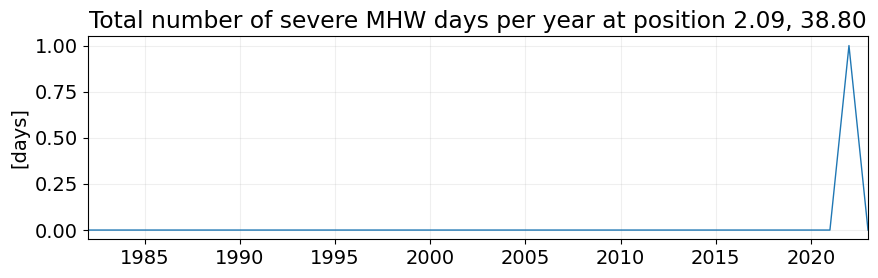

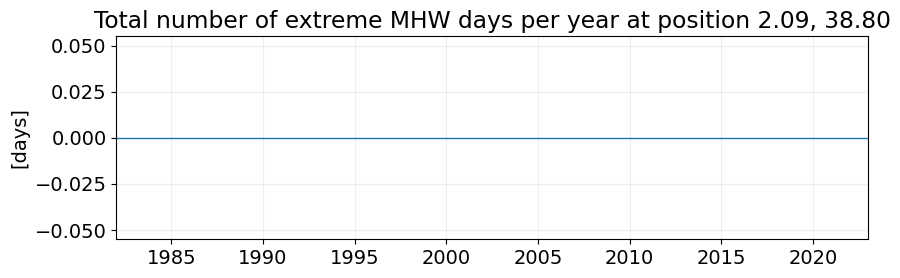

In [ ]:
from data_plotters.basic_plotting import plot_timeserie
import numpy as np

lon = np.random.choice(ds_mhws.lon)
lat = np.random.choice(ds_mhws.lat)

for stat in ds_mhws.data_vars:
    plot_timeserie(
        ds_mhws.sel(lon=lon,lat=lat)[stat],
        ds_mhws.year,

        nans_to_zero=True,
        xlim=[1982,2023],

        title=f"{ds_mhws[stat].attrs['longname']} at position {lon:.2f}, {lat:.2f}",
        figsize=(9,3),
        fontsize=14,

        show_plot=True
    )

## Dragonera time series

In [ ]:
from data_plotters.timeseries_TEMP import plot_timeserie



for stat in ds_mhws.data_vars:
    plot_timeserie(
        ds_mhws.sel(lon=2.10,lat=39.56, method='nearest')[stat],
        ds_mhws.year,

        nans_to_zero=True,
        xlim=(1982,2023),

        title=f"{ds_mhws[stat].attrs['longname']} at position {lon:.2f}, {lat:.2f}",
        figsize=(9,3),
        fontsize=14,

        show_plot=True
    )

## Region time serie

In [100]:
ds_mhws

<xarray.Dataset> Size: 47MB
Dimensions:               (lat: 65, lon: 120, year: 42)
Coordinates:
  * lon                   (lon) float32 480B -0.9592 -0.9092 ... 4.946 4.996
  * lat                   (lat) float32 260B 37.75 37.8 37.85 ... 40.91 40.96
  * year                  (year) int64 336B 1982 1983 1984 ... 2021 2022 2023
Data variables: (12/18)
    count                 (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 7.0 7.0
    duration              (lat, lon, year) float64 3MB nan nan ... 22.0 14.29
    intensity_max         (lat, lon, year) float64 3MB nan nan ... 3.654 2.833
    intensity_max_max     (lat, lon, year) float64 3MB nan nan ... 4.484 4.075
    intensity_mean        (lat, lon, year) float64 3MB nan nan ... 2.759 2.196
    intensity_var         (lat, lon, year) float64 3MB nan nan ... 0.5108 0.3785
    ...                    ...
    temp_max              (lat, lon, year) float64 3MB nan nan ... 29.41 28.8
    temp_min              (lat, lon, year) float64 3MB nan nan ... 12.87 13.13
    moderate_days         (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 99.0 90.0
    strong_days           (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 34.0 28.0
    severe_days           (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 0.0 0.0
    extreme_days          (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    climatologyPeriod:  1987-2021
    description:        MHWs yearly statistics computed using the marineHeatW...

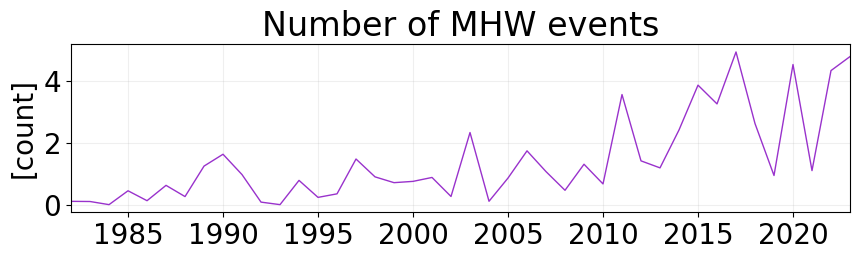

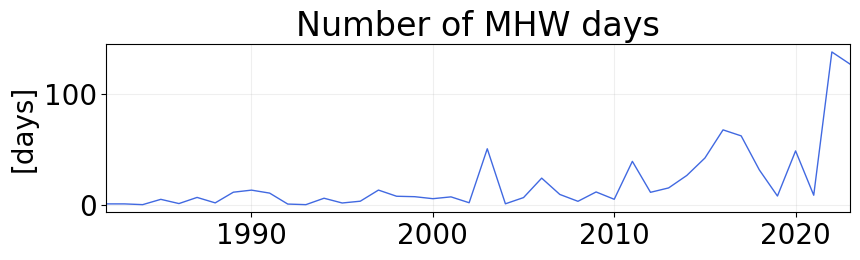

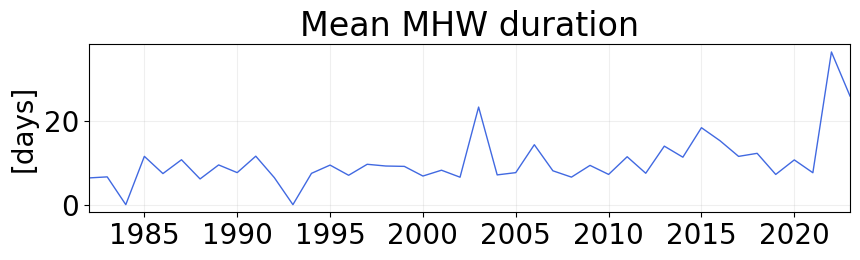

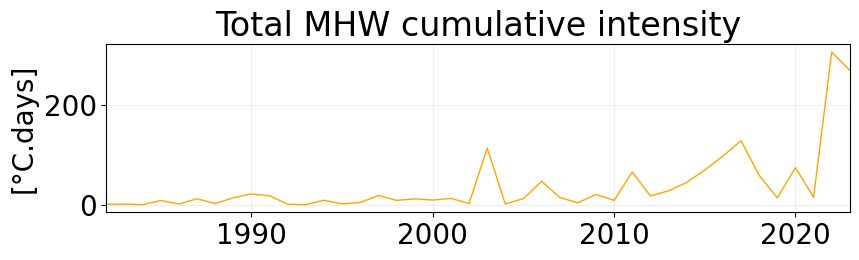

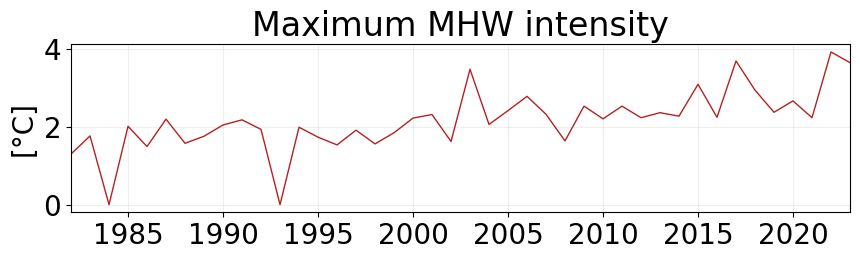

...

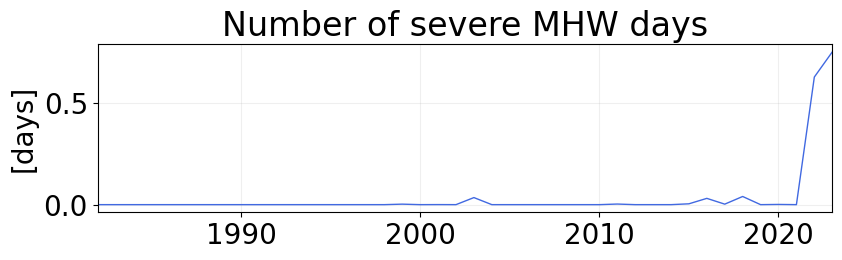

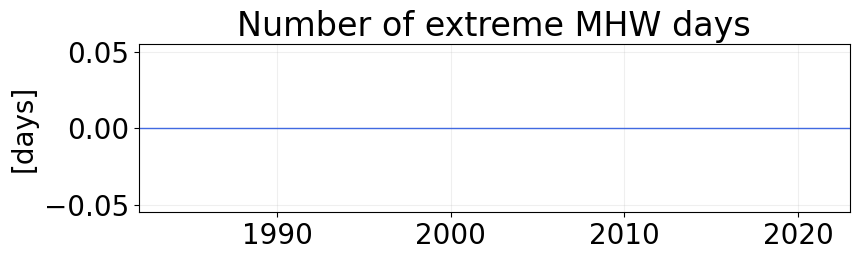

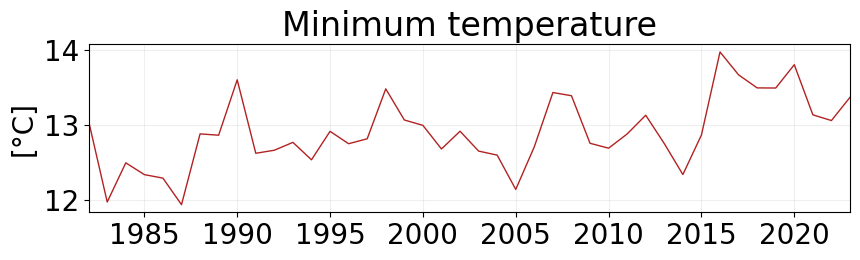

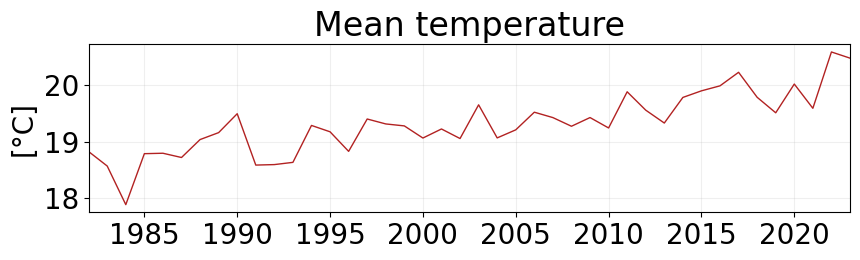

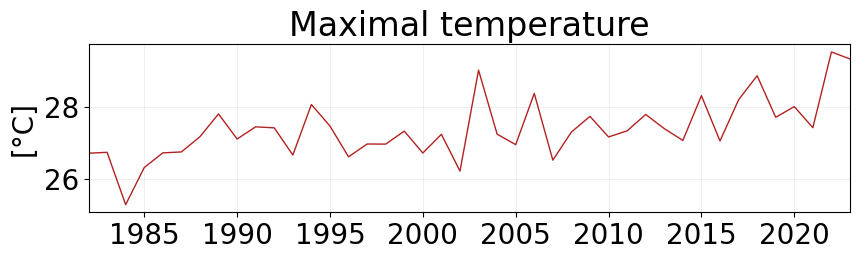

In [102]:
from data_plotters.timeseries_TEMP import plot_timeserie

for stat in stat_verbose:
    plot_timeserie(
        ds_mhws.mean(dim=["lon","lat"], keep_attrs=True)[stat],
        ds_mhws.year,

        colors = "darkorchid"
                if ds_mhws[stat].attrs.get("unit") == "count"
                else
                    "royalblue"
                    if ds_mhws[stat].attrs.get("unit") == "days"
                    else
                        "firebrick"
                        if ds_mhws[stat].attrs.get("unit") == "°C"
                        else
                            "orange",

        nans_to_zero=True,
        xlim=(1982,2023),

        title=f"{stat_verbose[stat]}",
        figsize=(9,3),
        fontsize=20,

        show_plot=True
    )

## 1982-2015 Region time serie

In [60]:
ds_mhws_mj.data_vars

Data variables:
    count                 (lat, lon, year) float64 3MB 0.0 0.0 0.0 ... 6.0 8.0
    duration              (lat, lon, year) float64 3MB nan nan ... 30.33 16.12
    intensity_max         (lat, lon, year) float64 3MB nan nan ... 3.69 2.838
    intensity_max_max     (lat, lon, year) float64 3MB nan nan ... 4.737 4.421
    intensity_mean        (lat, lon, year) float64 3MB nan nan ... 2.686 2.156
    intensity_var         (lat, lon, year) float64 3MB nan nan ... 0.5275 0.3939
    intensity_cumulative  (lat, lon, year) float64 3MB nan nan ... 82.64 38.88
    rate_onset            (lat, lon, year) float64 3MB nan nan ... 0.1971 0.3626
    rate_decline          (lat, lon, year) float64 3MB nan nan ... 0.6454 0.3483
    total_days            (lat, lon, year) float64 3MB 0.0 0.0 ... 162.0 149.0
    total_icum            (lat, lon, year) float64 3MB 0.0 0.0 ... 416.8 390.2
    temp_mean             (lat, lon, year) float64 3MB nan nan ... 19.91 19.77
    temp_max              (lat,

Loaded MHWs dataset.


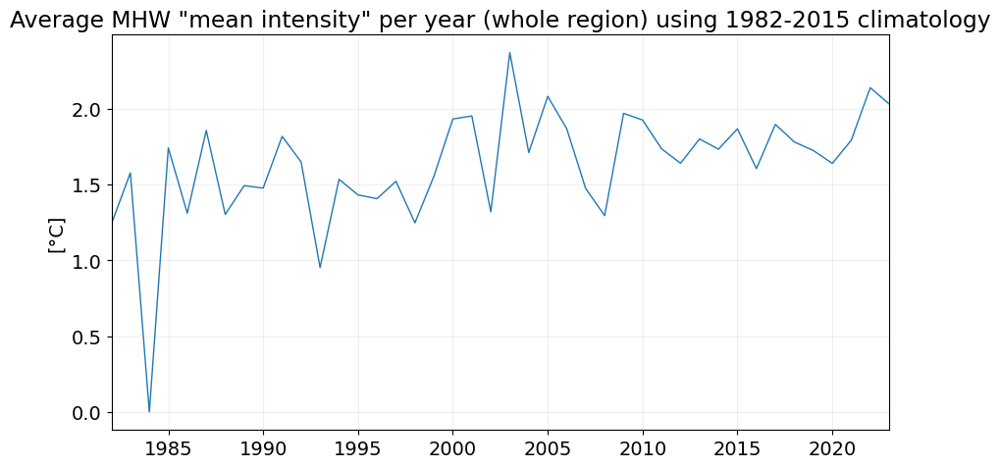

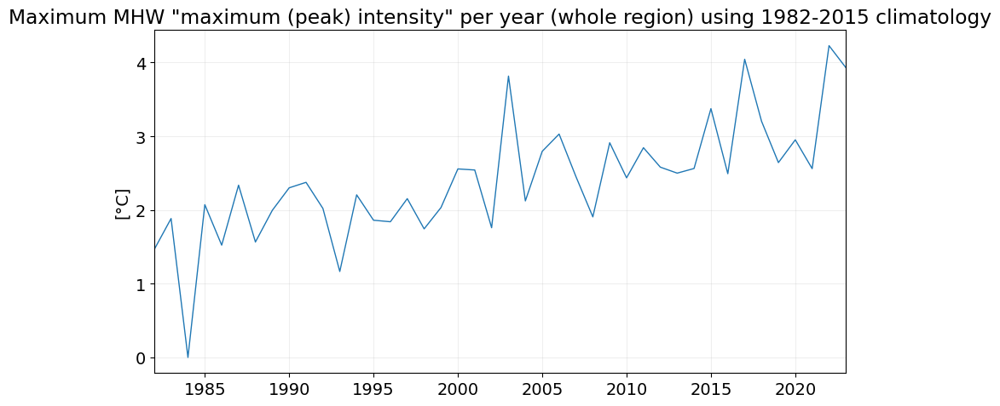

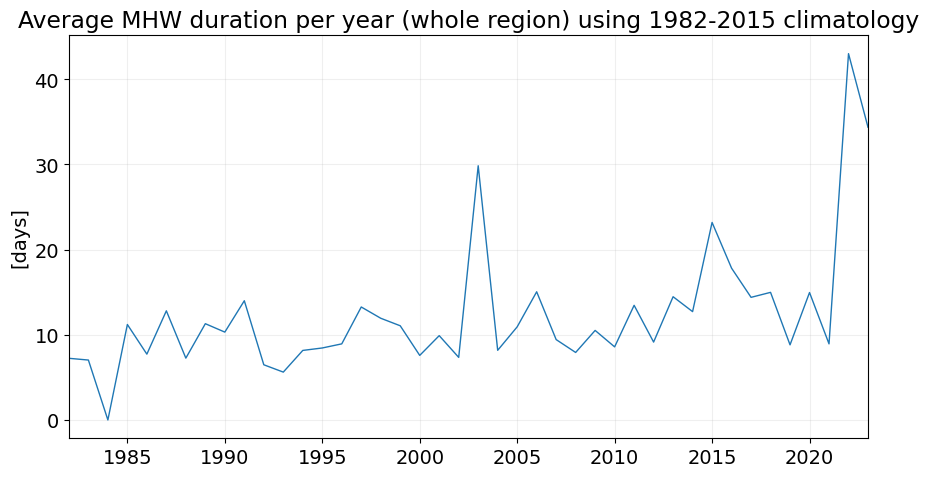

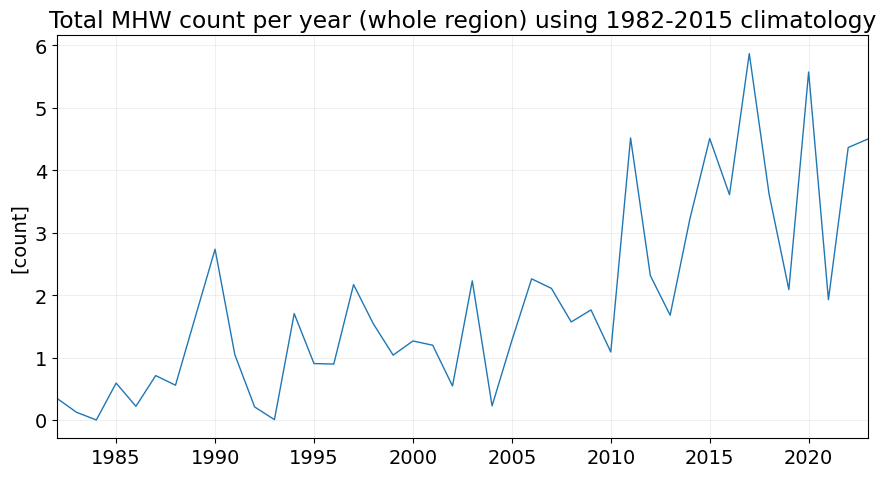

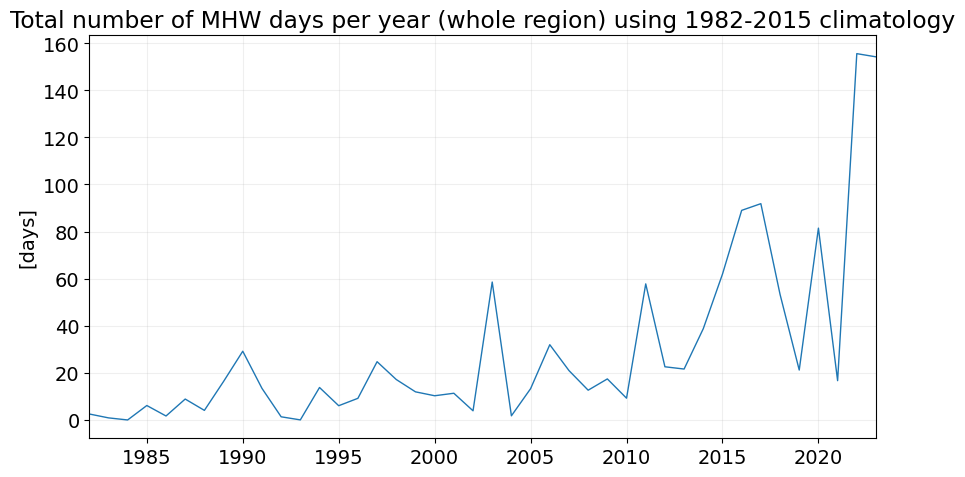

In [61]:
from data_plotters.timeseries_TEMP import plot_timeserie

ds_mhws_mj = load_mhws_dataset("cmems_sst", (1982,2015))

for stat in ["intensity_mean", "intensity_max_max", "duration", "count", "total_days"]:
    plot_timeserie(
        ds_mhws_mj.mean(dim=["lon","lat"], keep_attrs=True)[stat],
        ds_mhws_mj.year,

        nans_to_zero=True,
        xlim=(1982,2023),

        title=f"{ds_mhws_mj[stat].attrs['longname']} (whole region) using 1982-2015 climatology",
        figsize=(9,5),
        fontsize=14,

        show_plot=True
    )

## Mélanie's figures

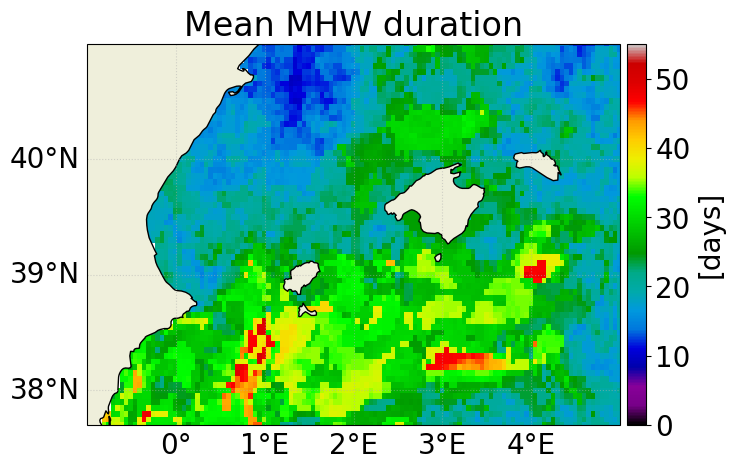

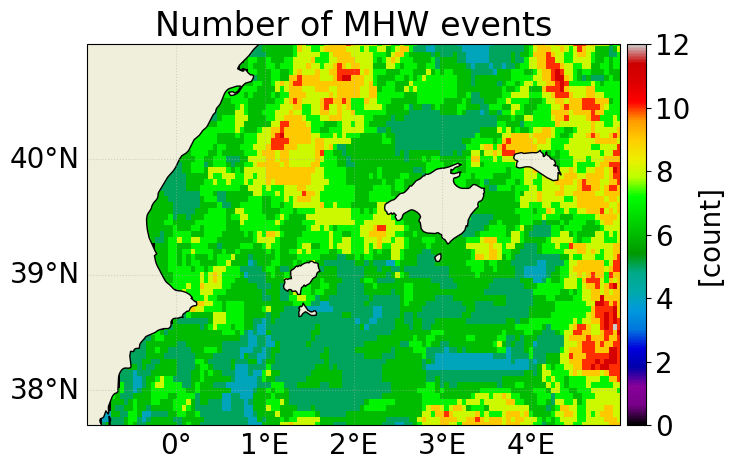

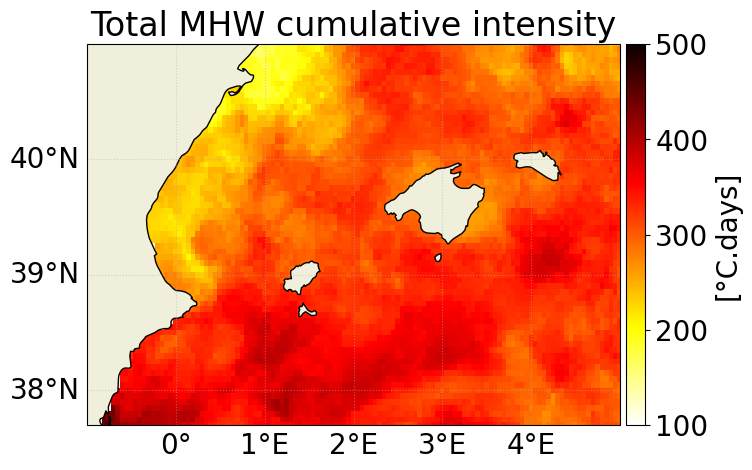

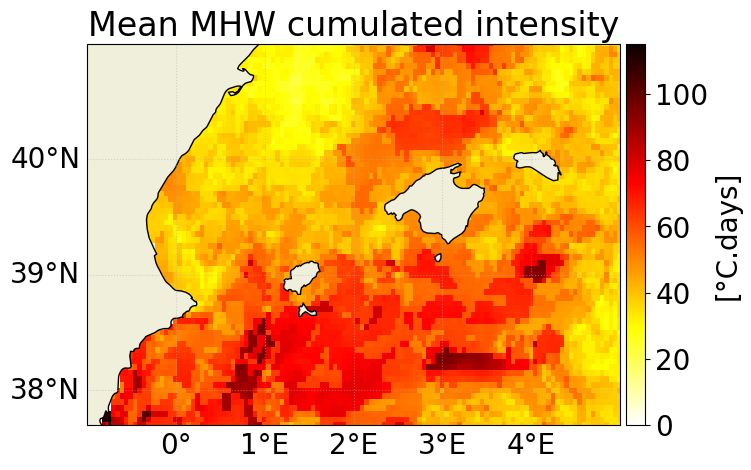

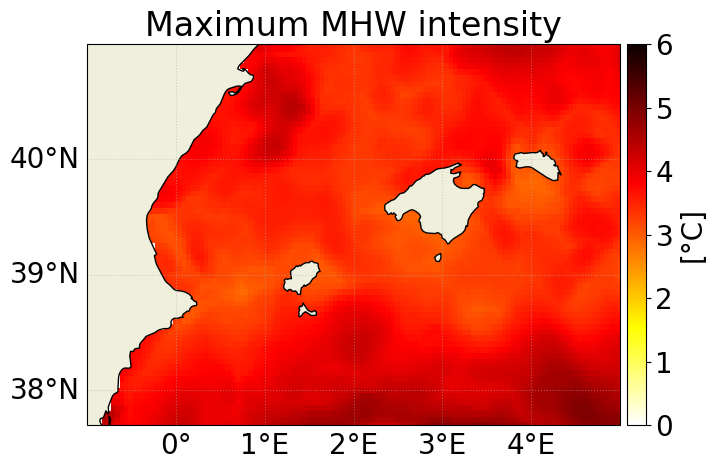

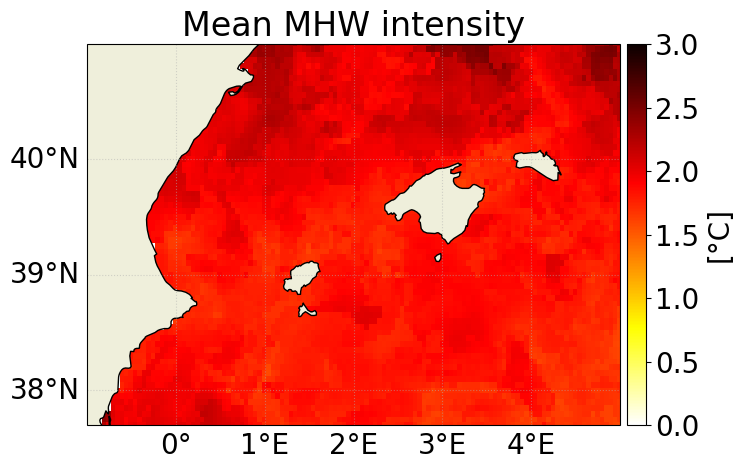

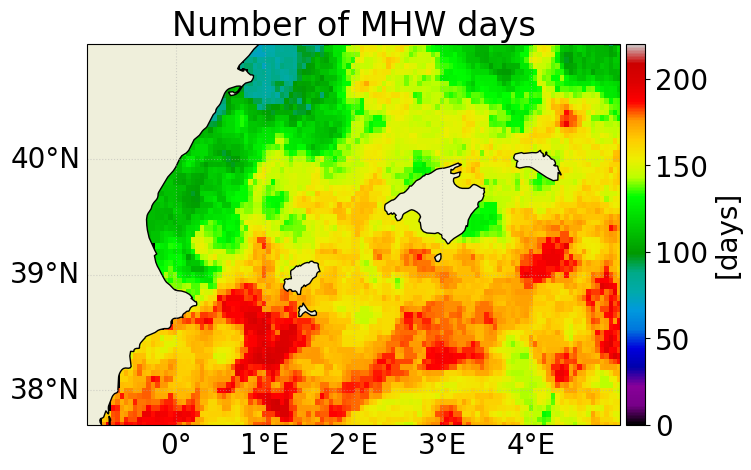

In [ ]:
from data_plotters.mhw_plot import plot_1year_stats_mhws_maps

for stat in ["duration",
        "count",
        "total_icum",
        "intensity_cumulative",
        "intensity_max_max",
        "intensity_mean",
        "total_days"
        ]:
    plot_1year_stats_mhws_maps(
        ds_mhws,
        year = 2023,
        stat_set = stat,
        custom_vlims = {
            "count":                (0, 12), # 0.00-11.00
            "duration":             (0, 55), # 9.62-61.00
            "total_icum":           (100, 500), # 0.00-502.79
            "intensity_cumulative": (0, 115), # 23.14-126.17
            "intensity_max_max":    (0, 6), # 2.86-4.95
            "intensity_mean":       (0, 3), # 1.59-2.63
            "total_days":           (0, 220), # 0.00-206.00
        },
        custom_cmaps={
            "duration": "nipy_spectral",
            "count": "nipy_spectral",
            "total_icum": "hot_r",
            "intensity_cumulative": "hot_r",
            "intensity_max_max": "hot_r",
            "intensity_mean": "hot_r",
            "total_days": "nipy_spectral",
        },
        title=""
    )